# <center>Analysis of Covid-19 chest X-rays</center>
In order to diagnose patients with Covid-19, the analysis of chest X-rays is a possibility to be explored to more easily detect positive cases. If the classification through deep learning of such data proves effective in detecting positive cases, then this method can be used in hospitals and clinics when traditional testing cannot be done.


## <center>Data Exploration</center>

Upgrade matplotlib to use subfigures

Necesary with default 3.2.2 google colab available version

In [ ]:
import matplotlib
matplotlib.__version__

In [ ]:
!pip install matplotlib --upgrade

Initialise code for google colab

Mount google drive

In [ ]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)


Create data base files under google colab environment

In [ ]:
!unzip '/content/drive/MyDrive/data.zip' -d '/content/'

Define working directory to our jupyter repertory:
* because path to the different repertories (./data, ./output...) are define relatevly to jupyter one
* let import _mypath which add ./lib to python path in order to import our own define libraries


In [ ]:
# for google colab use
%cd /content/gdrive/MyDrive/covid-19-xRay/jupyter
db_work_dir = '/content'

In [1]:
# for local use
db_work_dir = '..'

In [2]:
import _mypath
import os
import shutil
import pandas as pd
import numpy as np
import cv2 # import OpenCV
import matplotlib.pyplot as plt
%matplotlib inline
import scipy
import seaborn as sns
import joblib

from sklearn.metrics import silhouette_score

%load_ext autoreload
%autoreload 1



Build paths and variables for reading data base hierarchy

In [3]:
db_name = 'data'
# db_name = 'data_equalize'
db_path = os.path.join(db_work_dir, db_name)

output_path = os.path.join('..', 'output', 'data_exploration')
if not os.path.exists(output_path):
    os.makedirs(output_path, exist_ok=True)

Structure to manage paths in data base:

Produce a data_paths dataFrame:
* with index= ['db_name', 'ds_name', 'desease_name', 'data_type_name']
* path: folders hierarchical string path

See '../lib/path_origin_data.py' for db_name (database), ds_name (dataset), deesase_name, data_type_name possible values.


In [39]:
%aimport database.path_origin_data

from database.path_origin_data import build_data_paths 
from database.path_origin_data import lung_name, infection_name
from database.path_origin_data import train_name, test_name, valid_name
from database.path_origin_data import normal_name, covid_name, no_covid_name
from database.path_origin_data import images_name, lung_mask_name, infection_mask_name

from database.path_origin_data import images_dirname, lung_masks_dirname, infection_masks_dirname


In [5]:
data_paths = build_data_paths()
idx = pd.IndexSlice

Test equalizer function

**You can use code at the end of this notebook to produce severals plots at one time to compare images before and after intensity transformation**

Lung Segmentation Data/Val/COVID-19/images
../data/Lung Segmentation Data/Val/COVID-19/images/sub-S09683_ses-E25533_run-1_bp-chest_vp-ap_cr.png


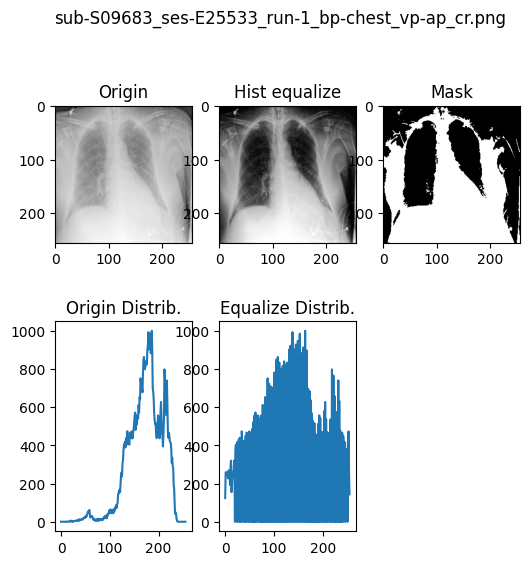

In [6]:
path = data_paths['path'].loc[idx[[lung_name], valid_name, covid_name, images_name]][0]
print(path)
full_file_path = os.path.join(db_path, path)
file_names = os.listdir(full_file_path)

# n = np.random.randint(0, len(file_names))
# print(n)
# file_name = file_names[n]
file_name = 'covid_1256.png'
file_name = 'sub-S09683_ses-E25533_run-1_bp-chest_vp-ap_cr.png'

full_file_name = os.path.join(full_file_path, file_name)
print(full_file_name)

image = cv2.imread(full_file_name, 0) 
image_rect = cv2.equalizeHist(image)

hist = cv2.calcHist([image],[0],None,[256],[0,256])
hist_rect = cv2.calcHist([image_rect],[0],None,[256],[0,256])

q1, q2 = scipy.stats.mstats.mquantiles(image_rect.flatten(), prob=[0.05, 0.95])

alpha = 0.7
threshold = (1. - alpha) * q1 + alpha * q2
ret, thresh = cv2.threshold(image, threshold, 255, 0)

fig, ax = plt.subplots(nrows=2, ncols=3, figsize=(6, 6))
fig.suptitle(os.path.basename(full_file_name))
ax.flatten()[0].imshow(image, cmap='gray');
ax.flatten()[0].set_title('Origin')
ax.flatten()[1].imshow(image_rect, cmap='gray');
ax.flatten()[1].set_title('Hist equalize')
ax.flatten()[2].imshow(thresh, cmap='gray');
ax.flatten()[2].set_title('Mask')
ax.flatten()[3].plot(hist);
ax.flatten()[3].set_title('Origin Distrib.')
ax.flatten()[4].plot(hist_rect);
ax.flatten()[4].set_title('Equalize Distrib.')
ax.flatten()[5].axis('off')

fig.savefig(os.path.join(output_path, 'pixels_distribution_' + file_name))


Compute statistics and geometrical metrics to analyse images.

Store the results, one file by image, in a folder hierarchy locatated under outpu_path and identical to database structure.

Deinition of stats filenames.

In [9]:
crude_stats_filename = 'crude_stats.joblib'
equalize_stats_filename = 'equalize_stats.joblib'

Choose the statistics filename

In [14]:
# stats_filename = crude_stats_filename
stats_filename = equalize_stats_filename

In [15]:
for path in data_paths.loc[idx[:,:,:,images_name]]['path']:
    full_file_path = os.path.join(db_path, path)
    full_output_path = os.path.join(output_path, path)
    #print(full_output_path)
    if not os.path.exists(full_output_path):
        os.makedirs(full_output_path, exist_ok=True)
    
    #print(full_file_path)
    file_names = os.listdir(full_file_path)
    
    stats_list = []
    for i, file_name in enumerate(file_names[:]):
        full_file_name = os.path.join(full_file_path, file_name)

        # read image
        # print(full_file_name)
        image = cv2.imread(full_file_name, 0)   

        # equalize image pixels
        # TO DESACTIVATE for crude statistique study
        # hist = cv2.calcHist([image], [0], None, [256],[0,256])
        image = cv2.equalizeHist(image)
        
        # first moments of image pixels distribution
        flatten_image = np.asarray(image).flatten()
        _, (mini, maxi), mean, var, skew, kurt = scipy.stats.describe(flatten_image)
        std = np.sqrt(var)
        # quantils
        q05, q1, median, q3, q95 = scipy.stats.mstats.mquantiles(flatten_image, prob=[0.05, 0.25, 0.5, 0.75, 0.95])
        
        # image mask by thresholding
        alpha = 0.7
        threshold = (1. - alpha) * q1 + alpha * q2
        ret, thresh = cv2.threshold(image, threshold, 1, 0)

        # iniertial moment of the mask: geometrical information
        m = cv2.moments(thresh)
        
        x_center = m["m10"] / m["m00"] if m["m00"] != 0 else m["m10"]
        y_center = m["m01"] / m["m00"] if m["m00"] != 0 else m["m01"]
        #print(m)
        #cv2.circle(image, (int(x_center), int(y_center)), 5, (255), -1)
        #cv2.imshow("Image", image)
        #cv2.waitKey(0)
        #cv2.destroyAllWindows()
        
        # store results
        stats_list.append([full_file_name,
                           mini, q1, median, q3, maxi, mean, std, skew, kurt,
                           m["m00"],
                           x_center, y_center,
                           m["nu20"], m["nu11"], m["nu02"],
                           m["nu30"], m["nu21"], m["nu12"], m["nu03"]])
    
    # store results in pandas dataframe
    stats = pd.DataFrame(stats_list, columns=['file_name',
                                              'mini', 'q1', 'median', 'q3', 'maxi', 'mean', 'std', 'skew', 'kurt',
                                              'm00',
                                              'x_center', 'y_center',
                                              'nu20', 'nu11', 'nu02',
                                              'nu30', 'nu21', 'nu12', 'nu03'])
    # save results in stats_filename
    full_stats_name = os.path.join(full_output_path, stats_filename)
    joblib.dump(stats, full_stats_name)



Define the working data base:
* lung_name for Lung Segmentation Data
* infection_name for Infection Segmentation Data

See '../lib/database/path_origin_data.py' file for more details.

In [7]:
# work_index = idx[[infection_name],:,:,[images_name]]
work_index = idx[[lung_name],:,:,[images_name]]

Read the statistical and geometrical metrics files.

Put the results in:
* a stats pandas dataframe with the statitics
* a true_labels one with:
  * db_name: the data base name (Lung vs Infection one),
  * ds_name:  dataset name (train, valid, test)
  * desease_name: normal, covid, no_covid
  * data_type_name: images, lung masks, infection masks

See '../lib/path_origin_data.py' for db_name (database), ds_name (dataset), desease_name, data_type_name possible values.
  

In [10]:
# stats filename to work on
# stats_used = crude_stats_filename
stats_used = equalize_stats_filename

# initialize dataframe
stats = None
true_labels = None

work_data_path = data_paths.loc[work_index]
print(len(work_data_path))
# work_data_path_index = work_data_path.index
# print(work_data_path_index[0])

for (ind, path) in work_data_path['path'].items():
    full_output_path = os.path.join(output_path, path)
    full_stats_name = os.path.join(full_output_path, stats_used)
    #print(os.path.exists(full_stats_name))
    
    # print(ind)
    stats_tmp = joblib.load(full_stats_name)
    # print(ind[2])
    true_labels_tmp = pd.DataFrame(data=[ind], columns=['db_name', 'ds_name', 'desease_name', 'data_type_name'])
    n = stats_tmp.shape[0]
    true_labels_tmp = true_labels_tmp.loc[true_labels_tmp.index.repeat(n)]
    
    if stats is None:
        stats = stats_tmp
        true_labels = true_labels_tmp
    else:
        stats = pd.concat([stats, stats_tmp], axis=0)
        true_labels = pd.concat([true_labels, true_labels_tmp], axis=0)
        
print(stats.shape)
#stats.index = work_index
file_names = stats['file_name'].reset_index(drop=True)
stats = stats.drop(columns=['file_name']).reset_index(drop=True)
true_labels = true_labels.reset_index(drop=True)
print(file_names.shape)
print(true_labels.shape)
#file_names

9
(33918, 20)
(33918,)
(33918, 4)


Duplicates detection base on equal statistics metrics.

In [11]:
print(stats.duplicated().sum())
print(len(stats))

stats_file = pd.concat([stats, file_names], axis=1)
cols = stats_file.columns[:-1]
test = stats_file.sort_values(cols.to_list())
test_gp = test.groupby(by=cols.to_list())

pd.set_option('display.max_colwidth', None)
i = 0
for key, values in test_gp.groups.items():
  if len(values) == 1:
    continue
  print(test.loc[values]['file_name'], "\n")
  i += 1
  if i >= 10:
    break;
pd.reset_option('display.max_colwidth')
# test_gp.head()



0
33918


Duplicated images discarded from datbase:<br>
keep ../data/Lung Segmentation Data/Test/COVID-19/images/covid_978.png <br>
discarded / already discarded ../data/Lung Segmentation Data/Val/COVID-19/images/covid_2473.png <br>
<br>
keep ../data/Lung Segmentation Data/Train/COVID-19/images/covid_686.png <br>
discarded / already discarded ../data/Lung Segmentation Data/Test/COVID-19/images/covid_3155.png <br>
<br>
keep ../data/Infection Segmentation Data/Train/COVID-19/images/covid_686.png <br>
discarded / already discarded ../data/Infection Segmentation Data/Test/COVID-19/images/covid_3155.png <br>

Features correlation map

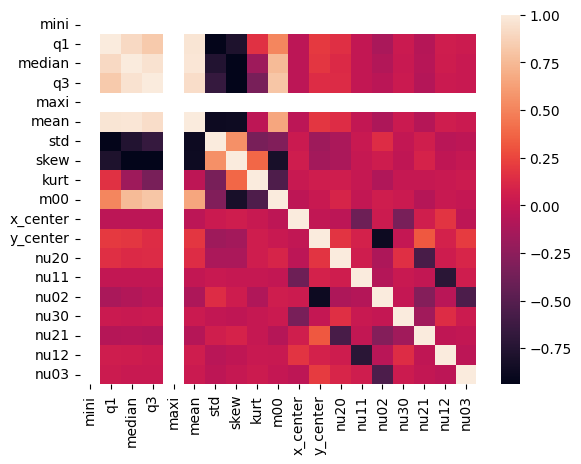

In [12]:
sns_plot = sns.heatmap(data=stats.corr());

fig = sns_plot.get_figure()
plt.savefig(os.path.join(output_path, 'all features correlation.png'), format='png')

Features selection

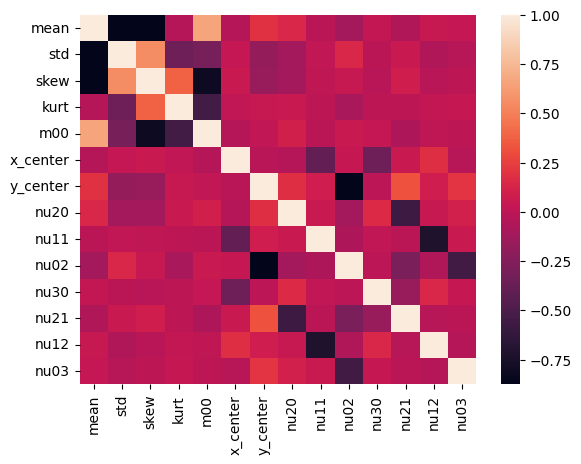

In [13]:
stats = stats.drop(columns=['mini', 'maxi', 'median', 'q1', 'q3'])
sns_plot = sns.heatmap(data=stats.corr());

fig = sns_plot.get_figure()
plt.savefig(os.path.join(output_path, 'selected features correlation.png'), format='png')

Features distribution visualiation

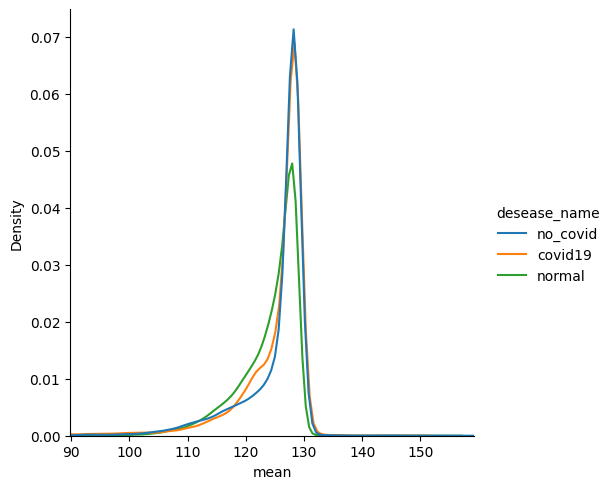

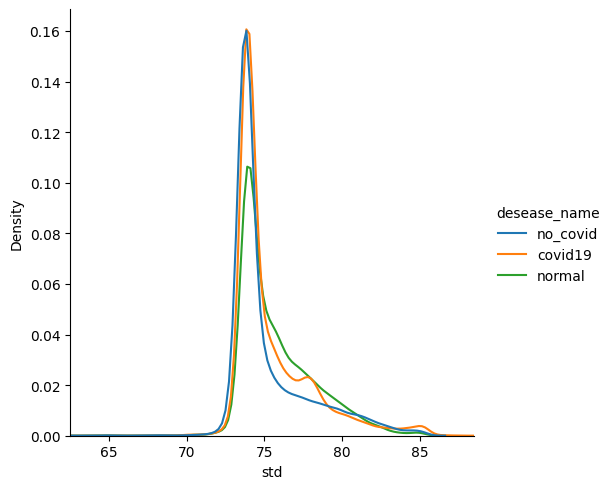

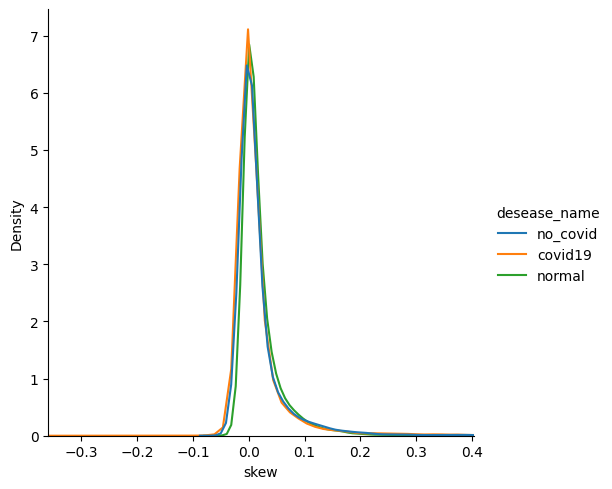

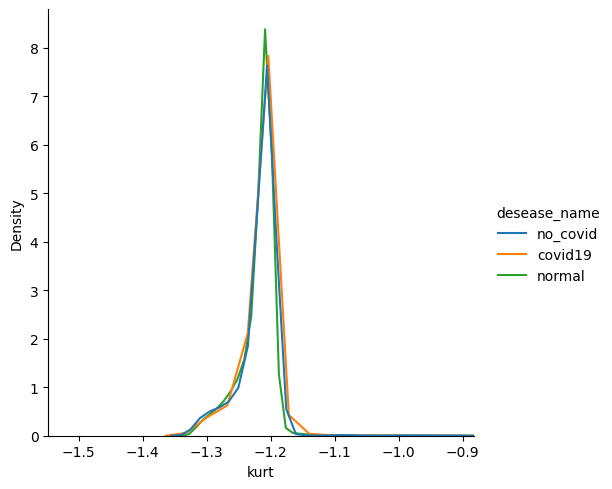

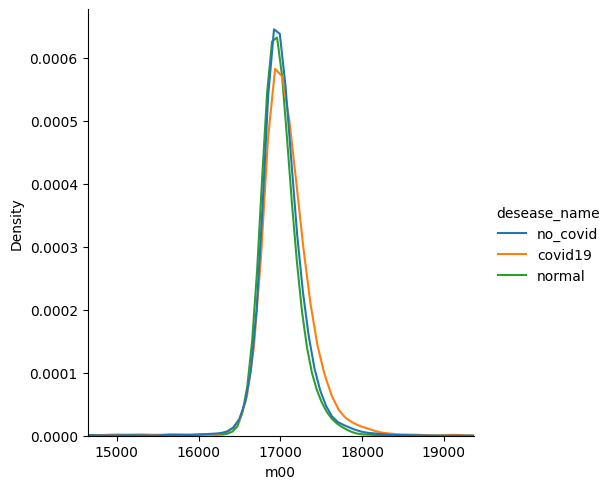

...

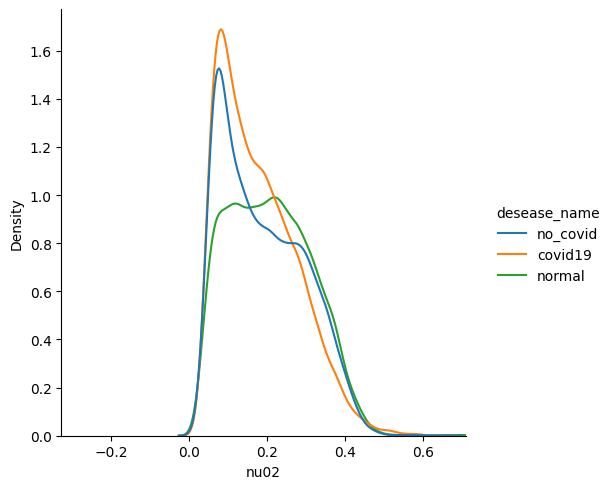

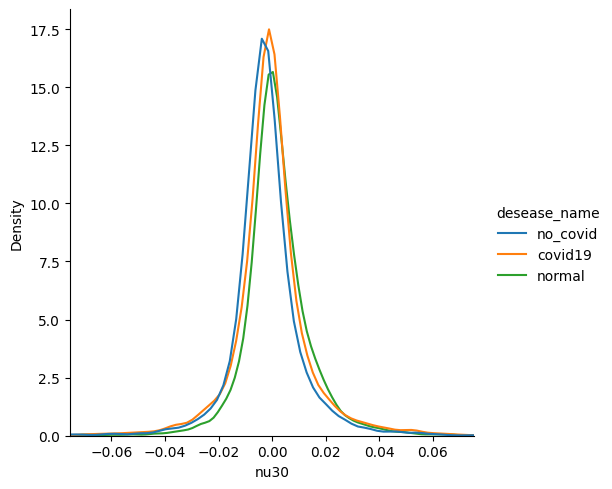

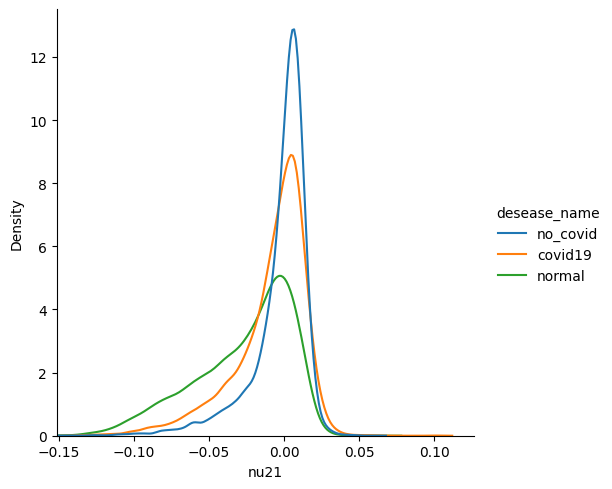

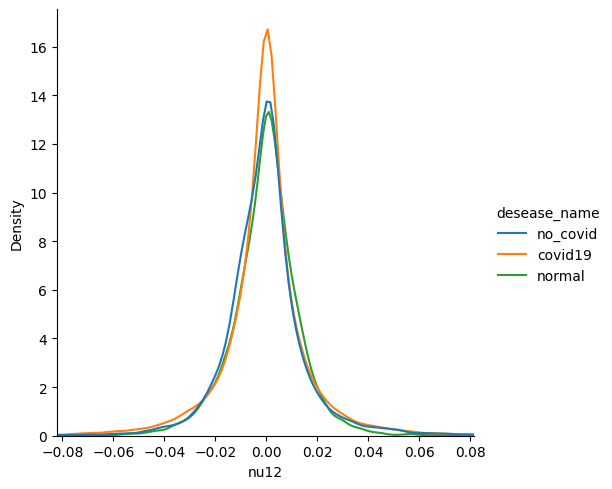

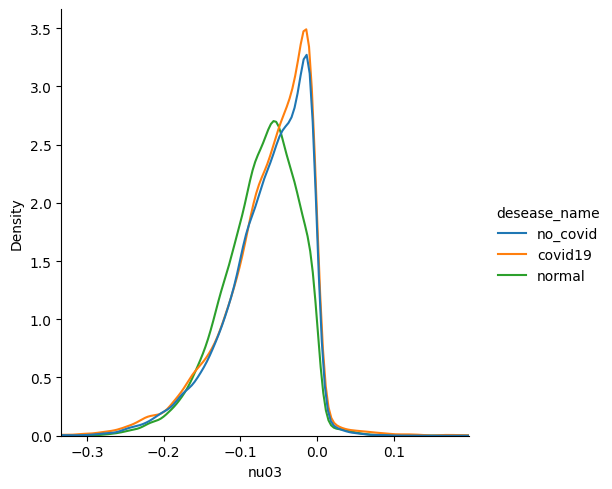

In [14]:
stats_visu = pd.concat([stats, true_labels['desease_name']], axis=1)
# stats_visu.info()

output_visu_path = os.path.join(output_path, 'features')
if not os.path.exists(output_visu_path):
    os.makedirs(output_visu_path, exist_ok=True)

range_rate = 5
cols = stats_visu.select_dtypes(include=['number']).columns
for i, col in enumerate(cols):
  m = stats[col].mean()
  std = stats[col].std()
  sns_plot = sns.displot(data=stats_visu, x=col, hue='desease_name', kind='kde');
  plt.xlim([m-range_rate*std, m+range_rate*std])
  plt.savefig(os.path.join(output_visu_path, col + '.png'), format='png')
  plt.show()

Features scaling

In [15]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
scaled_stats = scaler.fit_transform(stats)
scaled_stats = pd.DataFrame(scaled_stats, columns=stats.columns)
print(file_names.shape)

(33918,)


PCA analysis

In [16]:
from sklearn.decomposition import PCA

pca = PCA(tol=1e-6)
principalComponents = pca.fit_transform(scaled_stats)
principalComponents.shape

(33918, 14)

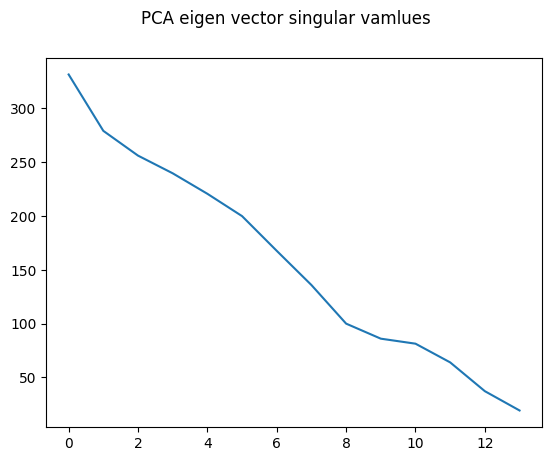

In [17]:

eigan_val = pca.singular_values_
x = range(0, eigan_val.shape[0])
plt.plot(x, eigan_val);
plt.suptitle('PCA eigen vector singular vamlues')
plt.savefig(os.path.join(output_path, 'pca singular values.png'), format='png')

Features selection:

I keep those over 10% (threshold: 30) of the first one (ie the main one) -> 11 dimensions kept.

In [18]:
num_dim = 11
selected_features = principalComponents[:, :num_dim]
# selected_features = principalComponents
# selected_features = scaled_stats
selected_features.shape

(33918, 11)

Outliers detection

In [19]:
# from sklearn import svm

# clf_osvm = svm.OneClassSVM(kernel='rbf', nu=0.00001, gamma='scale')
# # Model training
# clf_osvm.fit(selected_features)
# # Prediction from the explanatory variables of the test sample
# y_pred_osvm = clf_osvm.predict(selected_features)
# print(y_pred_osvm.shape)


In [19]:
from sklearn.ensemble import IsolationForest

isof = IsolationForest(contamination=0.0025, n_estimators=250, n_jobs=-1)

isof.fit(selected_features)
y_pred_isof = isof.predict(selected_features)
print(y_pred_isof.shape)


(33918,)


In [20]:
# y_pred_select = y_pred_osvm
y_pred_select = y_pred_isof
print(y_pred_select.shape)


(33918,)


Outliers visualization

85


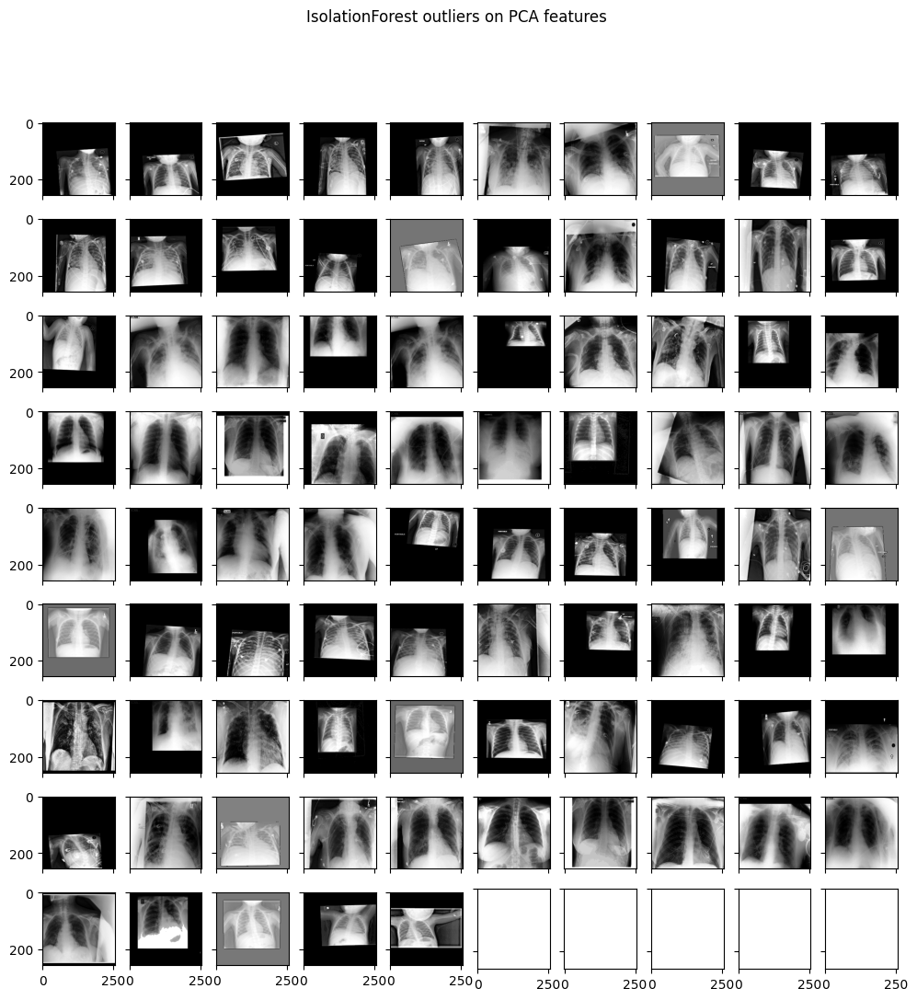

['../output/data_exploration/outliers.joblib']

In [22]:
ind = y_pred_select == -1
n_outliers = y_pred_select[ind].shape[0]
print(n_outliers)

# outliers = true_labels[ind]
# # outliers
# outliers['place'] = outliers.apply(lambda x: x['db_name'] + ' ' + x['ds_name'] + ' ' + x['desease_name'], axis=1)
# print(outliers['place'].unique())

outliers = file_names[ind]
n = len(outliers)
nrows = 9
ncols = 10
num_img = nrows * ncols
samples = outliers
if num_img < len(samples):
    samples = samples.sample(n=num_img, replace=False)
fig, ax = plt.subplots(nrows=nrows, ncols=ncols, sharex=True, sharey=True, figsize=(12, 12))
for i, file_name in enumerate(samples):
    image = cv2.imread(file_name, 0)
    image = cv2.equalizeHist(image)    
    ax.flatten()[i].imshow(image, cmap='gray')

plt.savefig(os.path.join(output_path, 'outliers.png'), format='png')
plt.suptitle('IsolationForest outliers on PCA features')
plt.show()
joblib.dump(outliers, os.path.join(output_path, 'outliers.joblib'))

Discard outliers for the following analysis.

But I don't descarded them from our database because:
* their number is small in regards to the whaole database sample
* somme are atypical but not all of them
* atypcal ones are still chest X-ray and worth to be trained in order to have a chance to detect covid on them.

In [23]:
# print(len(y_pred_select))
# print(len(file_names))
# print(len(true_labels))
# print(len(selected_features))

selected_features_cleaned = selected_features[y_pred_select == 1, :]

drop = y_pred_select == -1
file_names_cleaned = file_names.drop(file_names.iloc[drop].index).reset_index(drop=True)
true_labels_cleaned = true_labels.drop(true_labels.iloc[drop].index).reset_index(drop=True)

# print(len(file_names_cleaned))
# print(len(true_labels_cleaned))
# print(len(selected_features_cleaned))



K-means clustering.

The idea here is to:
* try to detect different classes in the database.
* analyse and visualize them to see if we can detect interesting feature
* evaluate if a classical ml approach on statistical features have a chance to succeed

In [25]:
from sklearn.cluster import KMeans

kmeans_kwargs = {'n_init':10}
sse = []
s_scores = []
k_number = 40
for k in range(1, k_number):
   kmeans = KMeans(n_clusters=k, **kmeans_kwargs)
   kmeans.fit(selected_features_cleaned)
   sse.append(kmeans.inertia_)

# for k in range(2, k_number):
   # # Calculation of the silhouette coefficient
   # s_score = silhouette_score(selected_features_cleaned, kmeans.labels_, metric='sqeuclidean')
   # s_scores.append(s_score)


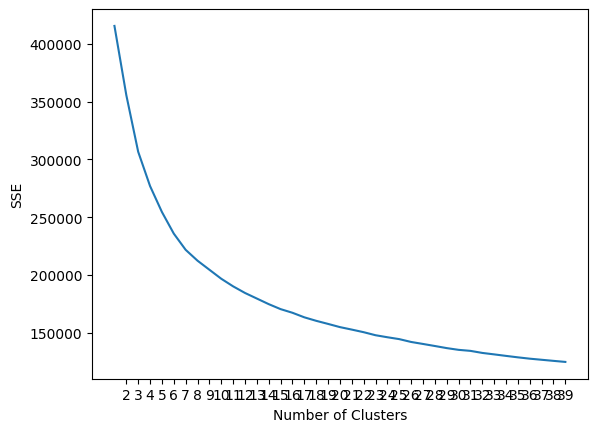

In [26]:
fig, ax1 = plt.subplots()
ax1.set_xticks(range(2, k_number))
ax1.set_xlabel("Number of Clusters")
ax1.set_ylabel("SSE")
ax1.plot(range(1, k_number), sse)

# ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis
# ax2.set_ylabel("Silhouette")
# ax2.plot(range(2, k_number), s_scores)
# ax2.plot(range(1, k_number), sse)

plt.savefig(os.path.join(output_path, 'sse and silhouette vs n clusters.png'), format='png')
plt.show()


We want to have an overview of the data and not to go too far in details so I keep homogenous classes with population from max to half the max observed.
-> I keep 10 classes

In [27]:
n_clusters = 10
kmeans_kwargs = {}
kmeans = KMeans(n_clusters=n_clusters, **kmeans_kwargs)
kmeans.fit(selected_features_cleaned)

print(kmeans.labels_.shape)

/Users/luc/.local/share/virtualenvs/covid-19-xRay-gI8RPtYc/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


(33833,)


Cluster visualization

In [30]:
visu = pd.concat([pd.DataFrame(selected_features_cleaned), pd.DataFrame(kmeans.labels_, columns=['label']), true_labels], axis=1)


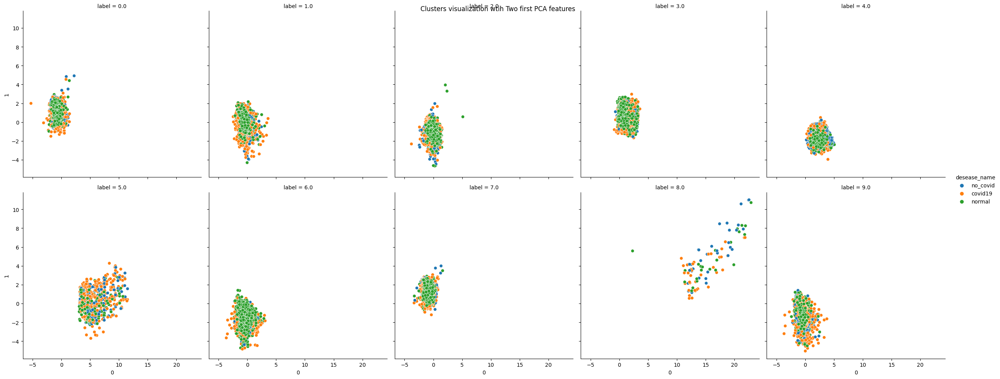

In [32]:
sns_plot = sns.relplot(data=visu, x=0, y=1, hue='desease_name', col='label', col_wrap=5);

fig = sns_plot.fig
fig.suptitle('Clusters visualization wtih Two first PCA features')
plt.savefig(os.path.join(output_path, 'clusters.png'), format='png')

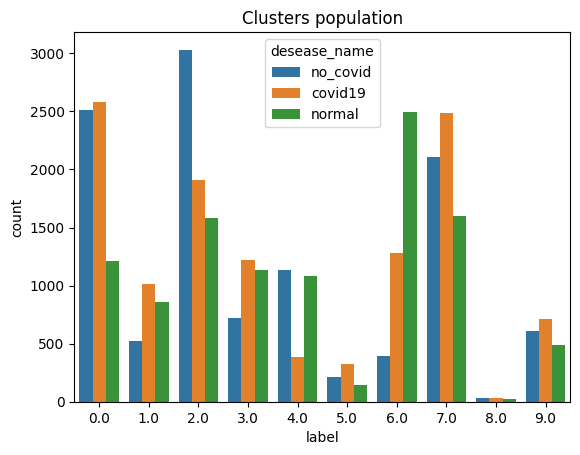

In [37]:
sns_plot = sns.countplot(data=visu, x='label', hue='desease_name');

sns_plot.set_title('Clusters population')
plt.savefig(os.path.join(output_path, 'clusters population.png'), format='png')

We can see that all no classe is really discriminat for our target label (normal, covid, no_covid), except perhaps class 6.

This is a hint that such a classical approach won't succed to classify the data correctly.

**It could be interesting to produce a statistical analysis (ANOVA) of this simple clustering to "prove" it.**

Cluster plots

In [29]:
labels = pd.Series(kmeans.labels_, name='label').astype(int)
# print(labels.shape)

file_names_cleaned_extended = pd.concat([file_names_cleaned, labels, true_labels_cleaned], axis=1)
# print(file_names_cleaned_extended.isna().sum())
# print(file_names_cleaned_extended.head())

file_names_cleaned_extended.columns

Index(['file_name', 'label', 'db_name', 'ds_name', 'desease_name',
       'data_type_name'],
      dtype='object')

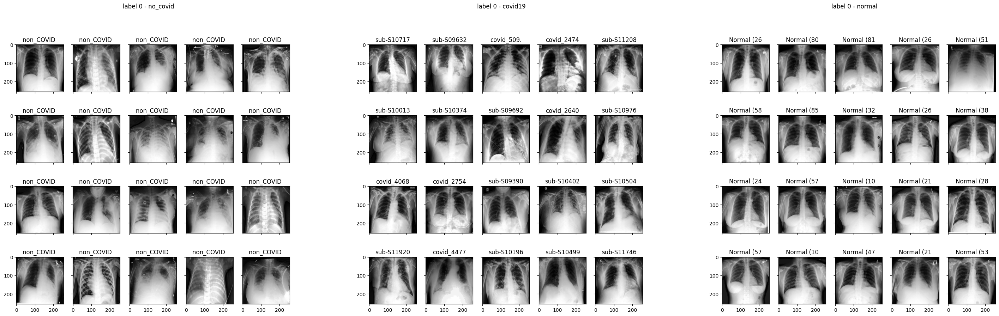

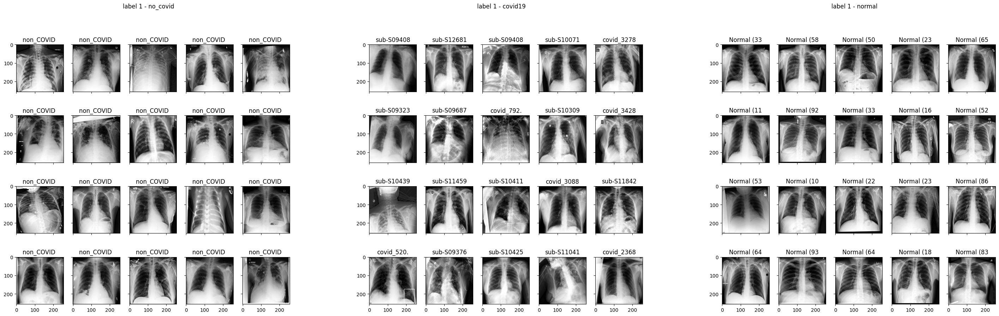

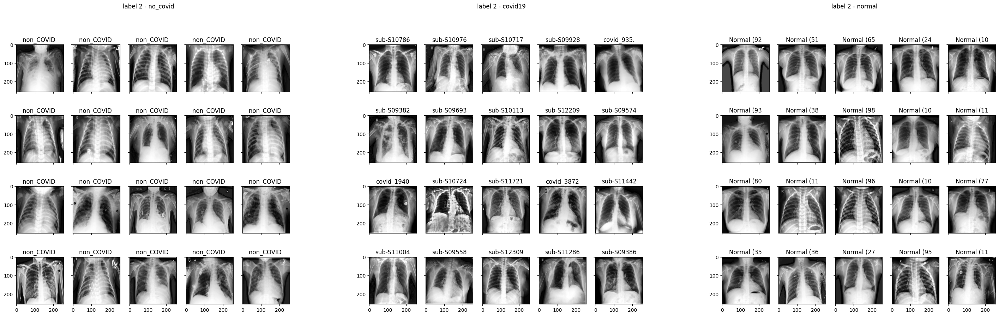

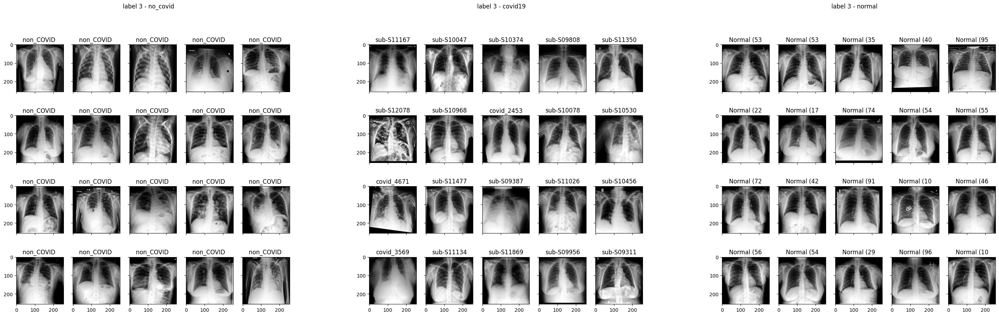

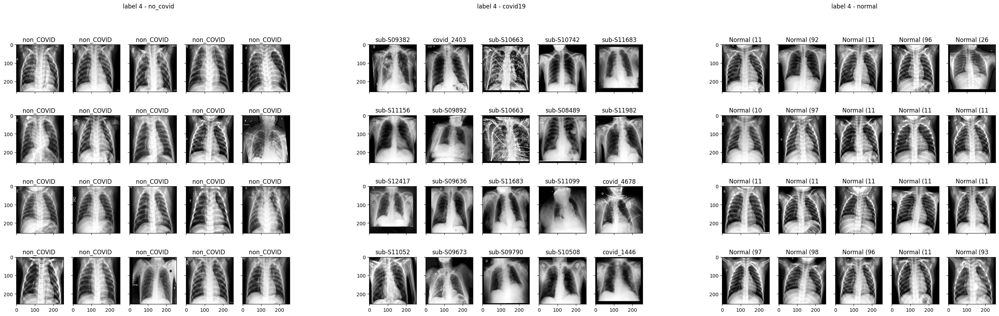

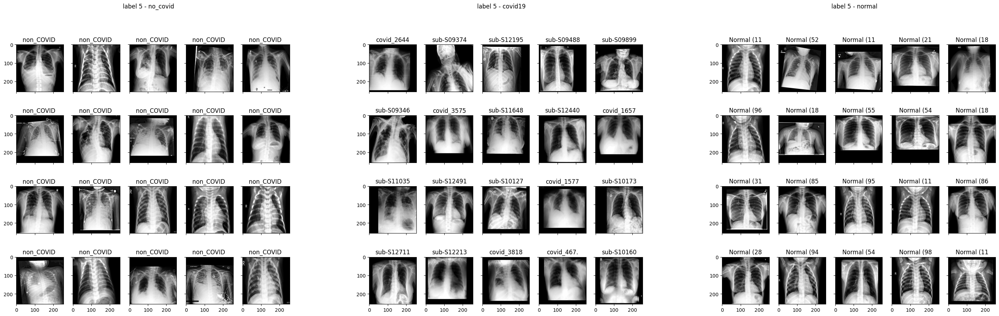

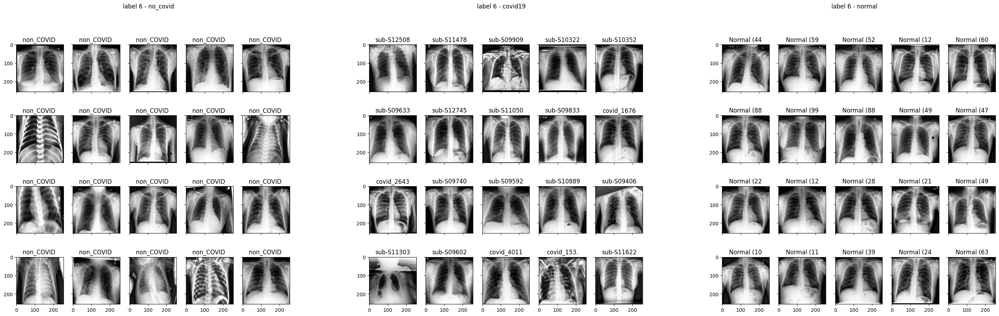

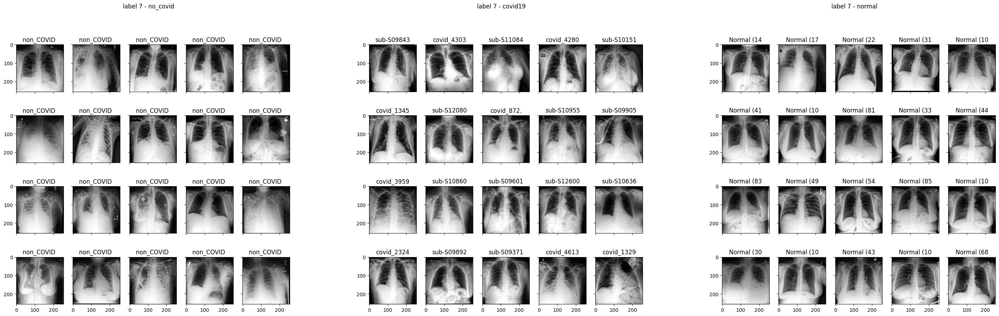

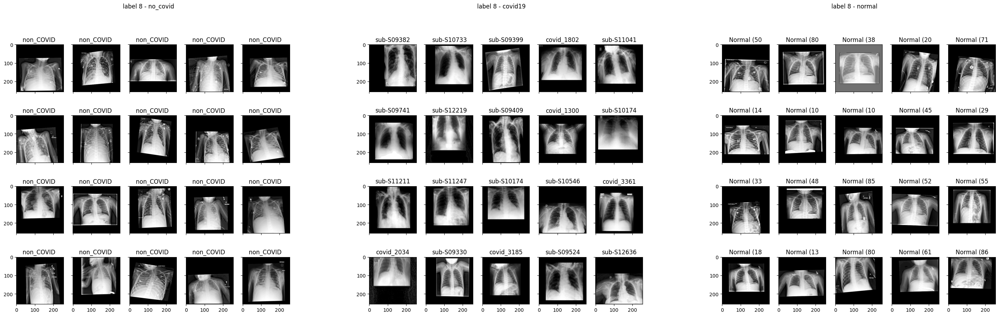

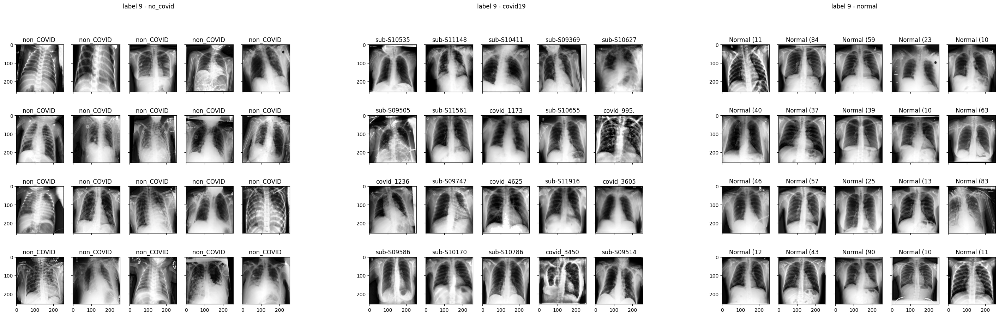

In [38]:
# sub_file_names = file_names_extended[file_names['db_name'] == infection_name]
sub_file_names = file_names_cleaned_extended
# print(sub_file_names.head())

labels_number = np.sort(sub_file_names['label'].unique())
# print(labels_number)

output_visu_path = os.path.join(output_path, 'clusters')
if not os.path.exists(output_visu_path):
    os.makedirs(output_visu_path, exist_ok=True)

nrows = 4
ncols = 5
num_img = nrows * ncols
for num_label in labels_number:
    label_file_names = sub_file_names[sub_file_names['label'] == num_label]
    # print(label_file_names.head())
    # n = len(label_file_names)
    
    deseases = label_file_names['desease_name'].unique()
    n_deseases = len(deseases)

    fig = plt.figure(figsize=(3*10, 10))
    sfigures = fig.subfigures(1, n_deseases)
    for i, des in enumerate(deseases):
        sfig = sfigures[i]
        ax = sfig.subplots(nrows=nrows, ncols=ncols, sharex=True, sharey=True)
        sfig.suptitle('label ' + str(num_label) + " - " + des)
    
    for i, des in enumerate(deseases):
        sub_label_file_names = label_file_names[label_file_names['desease_name'] == des]
        # print(sub_label_file_names.head())
        n = len(sub_label_file_names)

        sfig = sfigures[i]
        axes = sfig.get_axes()
        
        samples = sub_label_file_names
        if (len(samples) >= num_img):
          samples = samples.sample(n=num_img, replace=False)
        # print(sub_label_file_names.head())
        # print('sample: ', sample)
        for k, (_, row) in enumerate(samples.iterrows()):
            # print('row: ', row)
            file_name = row['file_name']
            db_name = row['db_name']

            image = cv2.imread(file_name, 0)   
            image = cv2.equalizeHist(image)

            axe = axes[k]
            axe.imshow(image, cmap='gray')
            
            # print(db_name + ' - ' + infection_name)
            if  db_name == infection_name:
                # print(db_name + ' - ' + infection_name)
                mask_infection = cv2.imread(file_name.replace(images_dirname, infection_masks_dirname), 0) 
                axe.imshow(mask_infection, alpha=0.4)

            f_name = os.path.basename(file_name)[:10]
            # print(f_name)
            axe.set_title(f_name)

    # label_file_names = label_file_names.sample(n=num_img, replace=False)
    # for i, file_name in enumerate(label_file_names['file_name']):
    #     image = cv2.imread(file_name, 0)    
    #     ax_0.flatten()[i].imshow(image, cmap='gray')

    plt.savefig(os.path.join(output_visu_path ,'label_' + str(num_label) + '.png'), format='png')
    plt.show()
    plt.close(fig)
    
# plt.show()

***
***
### Due to some observations during my deep learning models, hints lead to differencies in the density probability distribution of the images between train, valid and test set.

### It could be great, if some one is interesting and have time to produce it, to:
### * use the centroide of the kmeans clustering done on train set to cluster the valid and test set.
### * analyse the distribution (count plot) of normal, covid, no-covid labels on the different classes through the 3 datasets.

### There is a chance than we can observe an unbalance distribution of our classes on the dataset.
***
***

The following code let plot original images w.r.t image transformation as:
* equalize hist
* Test with CLAHE(Contrast Limited Adaptive Histogram Equalization)<br>
ref: https://docs.opencv.org/3.1.0/d5/daf/tutorial_py_histogram_equalization.html<br>

Coment / uncoment the code to obtain the plot you desire.

The code can be adapted to produce plots with 3 columns:
* origin
* equalize hist
* CLASHE

I finaly transforms our data base only with equalize hist because:
* it's important to regulary distribute pixel intensity over the whole range of value, enhance the contrast
* that's correct dispatity between low / high intentsity due to acquisition devices or protocol

CLASHE do the same but:
* it creates dicontinuities in the images because it apply equalize_hidst by block.
* That creates image pixelisation as in jpeg wwhen you try to apply a high compress rate. This is not appropriate for our aims
* same if CLASHE reduce this block effect by applying interpolation, that introduces artefacts and smoothing in our image that lead to loss of information.

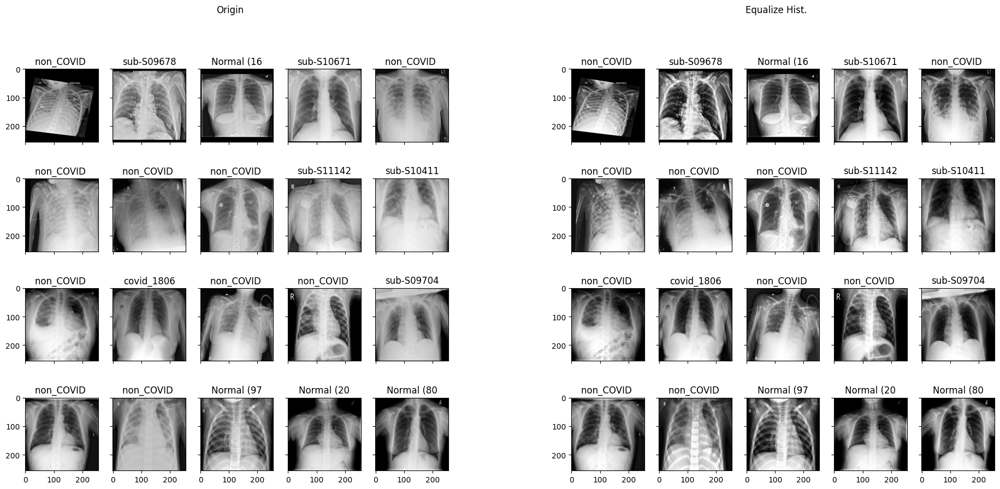

In [40]:
sub_file_names = file_names_cleaned_extended

n = len(sub_file_names)

fig = plt.figure(figsize=(2*10, 10))
fig_0, fig_1 = fig.subfigures(1, 2)
fig_0.suptitle('Origin')
# fig_1.suptitle('CLAHE')
fig_1.suptitle('Equalize Hist.')

nrows = 4
ncols = 5
num_img = nrows * ncols
fig_0.subplots(nrows=nrows, ncols=ncols, sharex=True, sharey=True)
axes_0 = fig_0.get_axes()
fig_1.subplots(nrows=nrows, ncols=ncols, sharex=True, sharey=True)
axes_1 = fig_1.get_axes()

# contrast_limit = 1.0
# clahe = cv2.createCLAHE(clipLimit=contrast_limit, tileGridSize=(16, 16))

samples = sub_file_names
if (len(samples) >= num_img):
  samples = samples.sample(n=num_img, replace=False)
# print(samples.head())
for i, (_, row) in enumerate(samples.iterrows()):
    file_name = row['file_name']
    db_name = row['db_name']

    image = cv2.imread(file_name, 0)    
    axes_0[i].imshow(image, cmap='gray')
    
    # image = clahe.apply(image)
    image = cv2.equalizeHist(image)
    axes_1[i].imshow(image, cmap='gray')

    f_name = os.path.basename(file_name)[:10]
    axes_0[i].set_title(f_name)
    axes_1[i].set_title(f_name)

    mask_lung = cv2.imread(file_name.replace(images_dirname, lung_masks_dirname), 0) 
    axe.imshow(mask_lung, alpha=0.4)

    if  db_name == infection_name:
        # print(db_name + ' - ' + infection_name)
        mask_infection = cv2.imread(file_name.replace(images_dirname, infection_masks_dirname), 0) 
        axe.imshow(mask_infection, alpha=0.4)

# plt.savefig(os.path.join(output_visu_path ,'CLASHE.png'), format='png')
plt.savefig(os.path.join(output_path ,'equalizeHist.png'), format='png')
plt.show()
plt.close(fig)
